In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from genetic_algorithm import GeneticAlgorithm
from simulation import Simulator

In [3]:
# -- Параметры симуляции ----------------------------------------------------
M                     = 20    # количество строк склада
N                     = 20    # количество столбцов склада
ENTRIES               = 40    # количество входных ячеек
EXITS                 = 40    # количество выходных ячеек
SAVES                 = 40    # количество ячеек хранения
NUM_ROBOTS            = 40    # количество роботов
CONTAINERS_TO_PROCESS = 200   # контейнеров для обработки (критерий завершения)
PROB                  = 0.25  # вероятность появления контейнера / команды на выход за такт

# -- Гиперпараметры ГА -----------------------------------------------------
ga = GeneticAlgorithm(
    m=M, n=N,
    entries=ENTRIES, exits=EXITS, saves=SAVES,
    num_robots=NUM_ROBOTS,
    containers_to_process=CONTAINERS_TO_PROCESS,
    prob=PROB,
    pop_size=40,
    generations=2,
    k_tournament=10,
    elitism_count=5,
    pm=0.2,
    K_swaps=3,
    rng_seed=42,
)

Оценка начальной популяции...
Поколение 0: best = 166, avg = 180.80
Поколение 1: best = 158, avg = 173.07, best_overall = 158
Поколение 2: best = 158, avg = 172.28, best_overall = 158


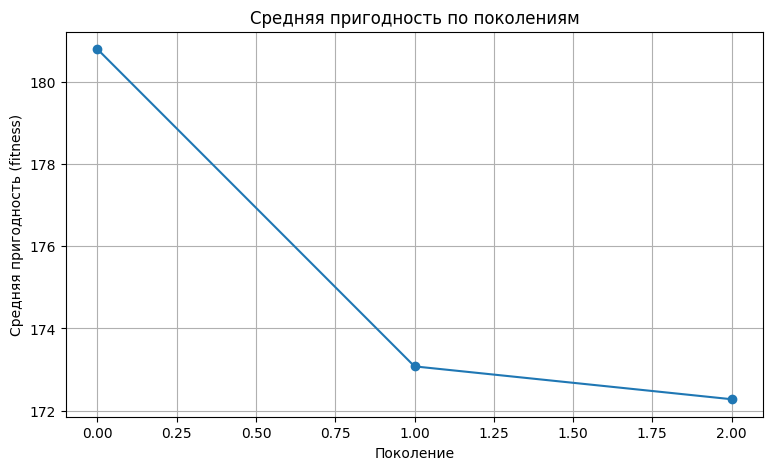

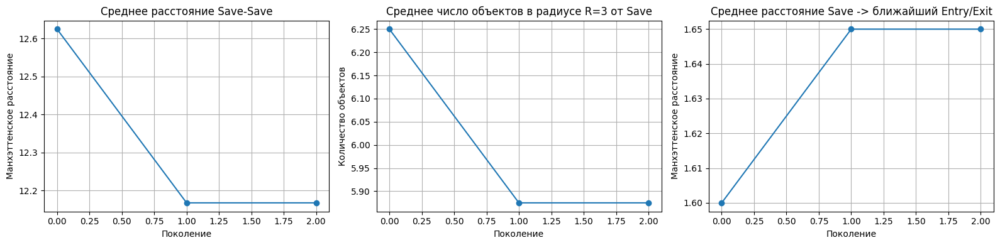

In [4]:
# ── Запуск эволюции ──
best, history = ga.run(verbose=True)

#print("\n=== Лучшая найденная конфигурация ===")
#print(best)
#print("Counts:", best.count_types())
#print("Fitness:", best.fitness)

#entries_arr, exits_arr, saves_arr = best.to_position_lists()
#print("Entries:", entries_arr)
#print("Exits:",   exits_arr)
#print("Saves:",   saves_arr)

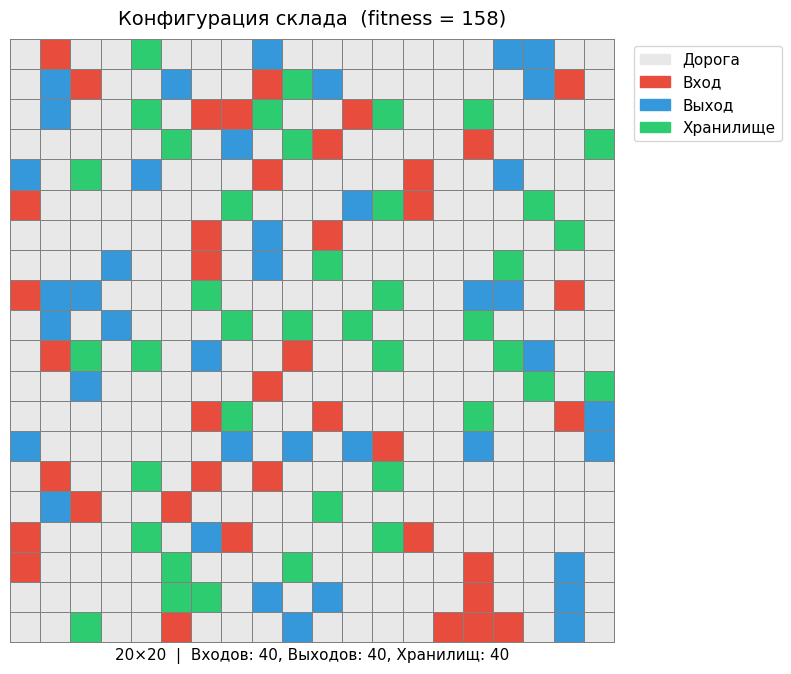

In [5]:
best.plot()

In [ ]:
# ── Анимация лучшей найденной конфигурации ────────────────────────────────────
entries_arr, exits_arr, saves_arr = best.to_position_lists()
sim = Simulator(
    M, N, NUM_ROBOTS,
    len(entries_arr), len(exits_arr), len(saves_arr),
    CONTAINERS_TO_PROCESS, PROB,
    are_position_sampled=False,
    entries_arr=entries_arr, exits_arr=exits_arr, saves_arr=saves_arr,
)
sim.run_animated()
sim.out  # отобразить анимацию в виде встроенного HTML